### LoopFlopy Example 3 - Adding Heterogeneity  
WORK IN PROGRESS DON'T USE

In [1]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import subprocess
import sys
import os
import pickle
import flopy
import geopandas as gpd
from shapely.geometry import LineString,Point,Polygon,MultiPolygon,MultiPoint,shape

%load_ext autoreload
%autoreload 2

import loopflopy
import loopflopy.utils as utils

print(loopflopy.__file__)
modules = utils.list_modules(loopflopy)
for module in modules: print(module)

C:\Users\00105295\Projects\loopflopy\src\loopflopy\__init__.py
dem
disv2disu
flowmodel
flowmodel_routines
geomodel
geomodel2
geomodel_routines
mesh
mesh_routines
observations
project
properties
properties2
spatial
spatial_routines
structuralmodel
surfacerefinement
utils


### 1. Setup Project

In [2]:
# Project setup
name = 'example'
workspace = '../modelfiles/'
results = '../results/'
figures = '../figures/'
triexe = '../exe/triangle.exe'
mfexe_name = '../exe/mf6.exe'

from loopflopy.project import Project
project = Project(name, workspace, results, figures, triexe, mfexe_name)
project.crs = 28350  # UTM zone 50S, EPSG:28350

### 2. Spatial

In [3]:
from loopflopy.spatial import Spatial
spatial = Spatial(epsg = 28350)

from preproc.spatial import make_bbox_shp, make_model_boundary
make_bbox_shp(spatial, x0 = 348000, x1 = 390000, y0 = 6503000, y1 = 6520000) # x1 = 415000
make_model_boundary(spatial, boundary_buff = 500, simplify_tolerance = 800, node_spacing = 1000)

spatial.x0, spatial.x1, spatial.y0, spatial.y1

(363206.86262235837, 390000.0, 6503000.0380154895, 6520000.0)

In [4]:
from preproc.spatial import make_obs_bores, make_geo_bores, make_pump_bores
make_obs_bores(spatial)
make_geo_bores(spatial)
make_pump_bores(spatial)

from preproc.spatial import make_head_boundary, make_faults, make_lakes
make_head_boundary(spatial)
make_faults(spatial)
make_lakes(spatial)

from preproc.spatial import make_xsections, make_pilot_points
make_xsections(spatial)
make_pilot_points(spatial)

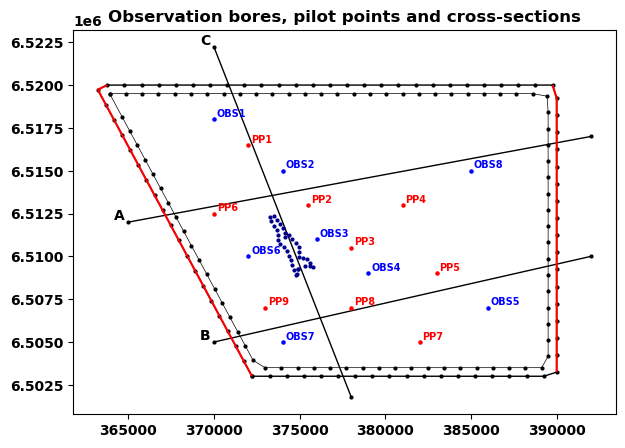

In [5]:
from preproc.spatial import plot_spatial_inputs
plot_spatial_inputs(spatial, 
                             obsbores = True, 
                             pilotpoints = True,
                             pumpbores = False, 
                             geobores = False, 
                             xsections = True, 
                             fault = False,
                             title = 'Observation bores, pilot points and cross-sections')

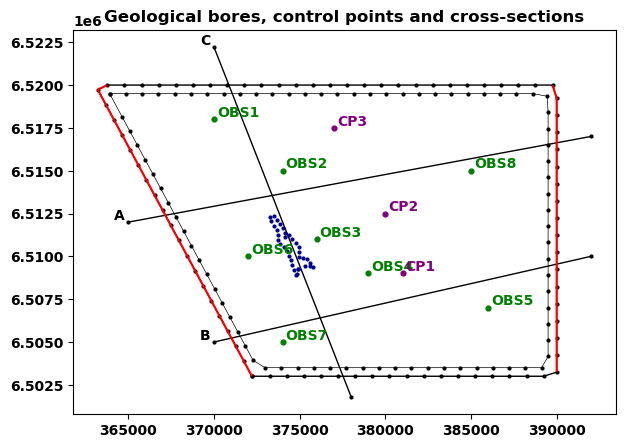

In [6]:
plot_spatial_inputs(spatial, 
                    obsbores = False, 
                    pilotpoints = False,
                    pumpbores = False, 
                    geobores = True, 
                    controlpoints = True,
                    xsections = True, 
                    fault = False,
                    title = 'Geological bores, control points and cross-sections')

In [7]:
# Create a map
m = spatial.obsbore_gdf.explore(location=[-31.4, 115.8], zoom_start=10, popup = 'ID')
spatial.model_boundary_gdf.explore(m=m, fill = False)
#spatial.faults_gdf.explore(m=m, color = 'red')
spatial.pumpbore_gdf.explore(m=m, color = 'red', popup = 'ID')

c:\Users\00105295\AppData\Local\anaconda3\envs\loopflopy\Lib\site-packages\pyproj\transformer.py:817: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return self._transformer._transform_point(
c:\Users\00105295\AppData\Local\anaconda3\envs\loopflopy\Lib\site-packages\pyproj\transformer.py:817: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return self._transformer._transform_point(


### 3. Structural Model

In [10]:
# A bounding box for structural model
x0, x1 = 348000, 400000
y0, y1 = 6500000, 6550000
z0, z1 = -1000, 500
bbox = [(x0, y0, z0), (x1, y1, z1)]

from loopflopy.spatial_routines import make_bbox_shp
crop_polygon = make_bbox_shp(x0, x1, y0, y1, crs=project.crs, fname = '../data/shp/structuralmodel.shp')

geodata_fname = '../data/example_data.xlsx'
data_sheetname, strat_sheetname = 'geo_bores', 'strat'

from loopflopy.structuralmodel import StructuralModel
structuralmodel = StructuralModel(bbox, geodata_fname, data_sheetname, strat_sheetname)

from preproc.structural import prepare_strat_column, prepare_geodata, create_structuralmodel
prepare_strat_column(structuralmodel)
prepare_geodata(structuralmodel, spatial, dem_tif = "../data/dem/cropped_raster.tif",
                control = True, truth = False, Fault = False)
create_structuralmodel(structuralmodel, Fault = False)

#structuralmodel.data

['Ground', 'TQ', 'Kcok', 'Kwlp', 'Kwlw', 'Kwlm']
['Ground', 'TQ', 'Kcok', 'Leed']
1.6.14


c:\Users\00105295\AppData\Local\anaconda3\envs\loopflopy\Lib\site-packages\LoopStructural\modelling\core\geological_model.py:646: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap, n_units)


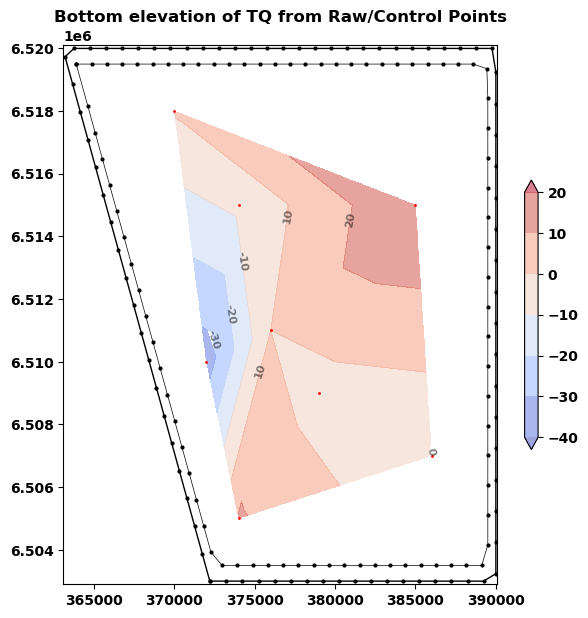

In [11]:
structuralmodel.contour_bottom(spatial, contour_interval = 10, unit = 'TQ',) 

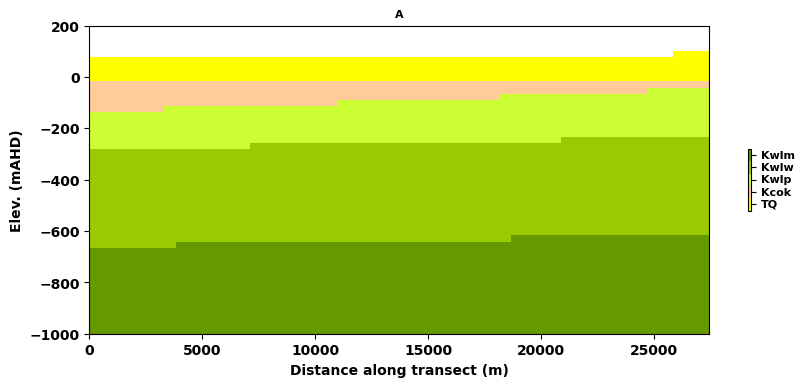

<Figure size 640x480 with 0 Axes>

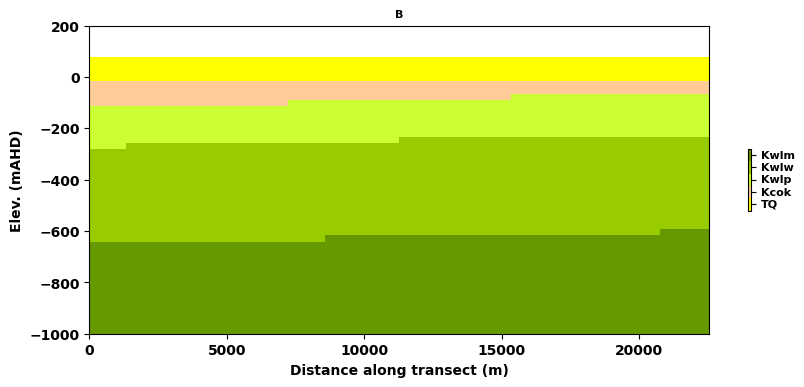

<Figure size 640x480 with 0 Axes>

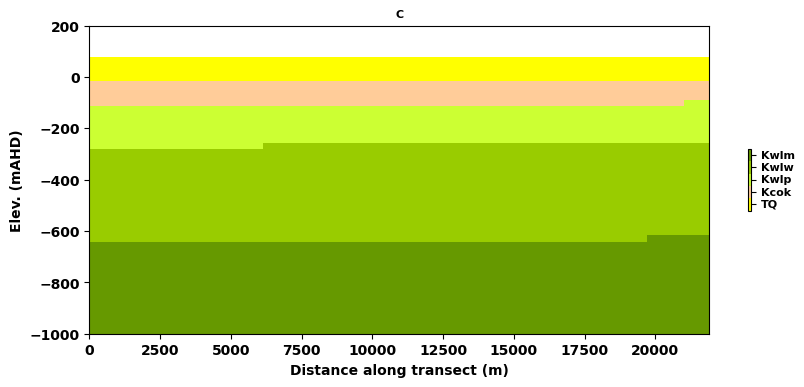

<Figure size 640x480 with 0 Axes>

In [12]:
z0 = -1000 # just for plotting. Make sure within bbox of structural model
z1 = 200   # just for plotting. Make sure within bbox of structural model
nh, nz = 50, 50 # plotting resolution

for i in range(len(spatial.xsections)):
    start = spatial.xsections[i][0]
    end   = spatial.xsections[i][1]
    structuralmodel.plot_xytransect(title = spatial.xsection_names[i], start = start, end = end, z0 = z0, z1 = z1, nh = nh, nz = nz)

In [11]:
'''def evaluate_model(structuralmodel, start, end, z0, z1, nh, nz, **kwargs):

    x0 = start[0]
    y0 = start[1]
    x1 = end[0]
    y1 = end[1]

    x = np.linspace(x0, x1, nh)
    y = np.linspace(y0, y1, nh)        
    z = np.linspace(z0, z1, nz)

    X = np.tile(x, (len(z), 1)) 
    Y = np.tile(y, (len(z), 1)) 
    Z = np.tile(z[:, np.newaxis], (1, nh))  # Repeat z along columns (nh times)

    labels = structuralmodel.strat_names[1:]
    ticks = [i for i in np.arange(0,len(labels))]
    boundaries = np.arange(-1,len(labels),1)+0.5

    a = np.array([X.flatten(),Y.flatten(),Z.flatten()]).T
    V = structuralmodel.model.evaluate_model(a).reshape(np.shape(X))

    return V

i = 0 # first transect
start = spatial.xsections[i][0]
end   = spatial.xsections[i][1]
nh, nz = 50, 50
V = evaluate_model(structuralmodel, start, end, z0, z1, nh, nz)
np.unique(V.flatten(), return_counts=True)'''

'def evaluate_model(structuralmodel, start, end, z0, z1, nh, nz, **kwargs):\n\n    x0 = start[0]\n    y0 = start[1]\n    x1 = end[0]\n    y1 = end[1]\n\n    x = np.linspace(x0, x1, nh)\n    y = np.linspace(y0, y1, nh)        \n    z = np.linspace(z0, z1, nz)\n\n    X = np.tile(x, (len(z), 1)) \n    Y = np.tile(y, (len(z), 1)) \n    Z = np.tile(z[:, np.newaxis], (1, nh))  # Repeat z along columns (nh times)\n\n    labels = structuralmodel.strat_names[1:]\n    ticks = [i for i in np.arange(0,len(labels))]\n    boundaries = np.arange(-1,len(labels),1)+0.5\n\n    a = np.array([X.flatten(),Y.flatten(),Z.flatten()]).T\n    V = structuralmodel.model.evaluate_model(a).reshape(np.shape(X))\n\n    return V\n\ni = 0 # first transect\nstart = spatial.xsections[i][0]\nend   = spatial.xsections[i][1]\nnh, nz = 50, 50\nV = evaluate_model(structuralmodel, start, end, z0, z1, nh, nz)\nnp.unique(V.flatten(), return_counts=True)'

### 4. Meshing

In [12]:
# Create mesh object
from loopflopy.mesh import Mesh
special_cells = {
                 'chd': ['east', 'west'], 
                 'wel': ['pumpbores'], 
                 'obs': ['obsbores'],
                 'poly': ['lake'], 
                 }
mesh = Mesh(plangrid = 'tri', special_cells = special_cells) # special cells to identify as arguements 

In [13]:
from preproc.mesh import define_mesh
define_mesh(mesh)

In [14]:
mesh.create_bore_refinement(spatial)

node_list = ['bore_refinement_nodes','lake_nodes']#fault_nodes', 'bore_refinement_nodes',]
polygon_list = ['model_boundary_poly', 'inner_boundary_poly']
mesh.prepare_nodes_and_polygons(spatial, node_list, polygon_list)
mesh.create_mesh(project, spatial)

print('number of cells in plan = ', mesh.ncpl)

Creating bore refinement nodes for pumping bores
bore_refinement_nodes
lake_nodes
Creating triangular grid
number of cells in plan =  6556


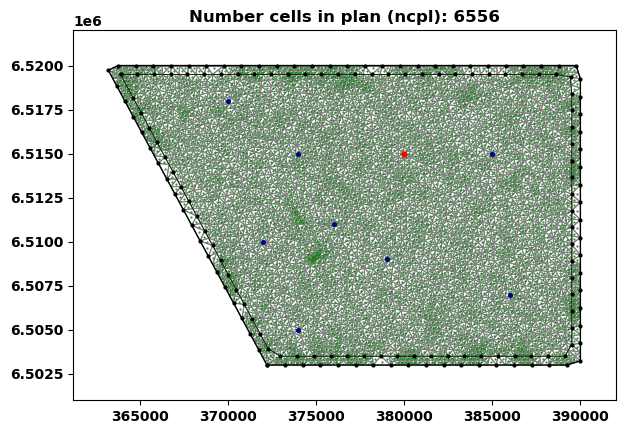

In [15]:
xlim = [spatial.x0 - 2000, spatial.x1 + 2000]
ylim = [spatial.y0 - 2000, spatial.y1 + 2000]

features = ['wel', 'obs', 'lake']
mesh.plot_cell2d(spatial, features, xlim = xlim, ylim = ylim)

### 5. Find Cell IDs of spatial features

Group =  chd ['east', 'west']
flag = 1
chd_east_cells [256 265 778 1181 258 261 780 260 777 2610 2557 290 2602 2601 2597 263
 2575 2592 2587 2579 2580 2581 2582 2604 2612 2591 2611 2616 2617 2630
 2618 2623 2629 281 5761 273 283 5899 274 282 5915 284 287 6173 394 354
 6369 345 6423 6413 6419 6421 6398 357 6405 6399 6407 6409 6402 365 6410
 6412 6414 5230 358 5976 5977 5972 5978 5983 363 5982 5985 5986 5996 360
 5989 5995 2705 3319 380 378 2711 2701 381]
chd_west_cells [10 4126 4127 4125 4124 4123 4120 3144 4115 4137 2 0 4140 4144 3 4114 4148
 3132 5 4 7 706 701 698 687 702 705 32 683 686 682 695 35 690 43 710 707
 24 732 22 25 1091 27 26 2940 29 165 144 2938 108 3937 114 2954 111 4195
 3207 113 112 1513 100 735 98 2487 2486 2482 2485 104 2489 737 739 1609
 1604 105 1607 1601 1605 1600 1160 1143 747 1145 142 1137 1142 1134 1136
 1131 1125 743 125 1150 124 1115 1110 1163 1152]
Group =  wel ['pumpbores']
flag = 3
Group =  obs ['obsbores']
flag = 4
Group =  poly ['lake']
flag = 5
poly_lake

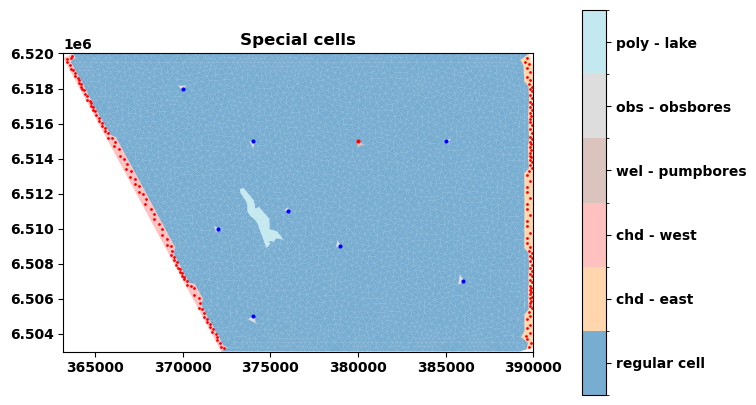

In [16]:
# Locate special cells and plot
mesh.locate_special_cells(spatial)

xlim = [355000, 370000]
ylim = [6525000, 6535000]

mesh.plot_feature_cells(spatial, xlim = None, ylim = None)

### 5. Topography

In [17]:
from loopflopy.dem import DEM

# Crops large DEM to structural model bounding box
uncropped_dem = DEM(geotiff_fname = "../data/dem/Hydro_Enforced_1_Second_DEM.tif")
uncropped_dem.crop_raster(bbox_path = "../data/shp/bbox.shp", cropped_raster_path = "../data/dem/cropped_raster.tif")

EPSG:28350
EPSG:28350


### 6. Geomodel

In [18]:
# Set up Geomodel (lithological block model of cells)
scenario = 'example'
vertgrid = 'con'    # {voxel: nlay, z0, z1} {con:   nls, res} {con2:  nls, res, max_thick}
z0, z1 = -1000, 200 

from loopflopy.geomodel import Geomodel # geomodel - pillar method + flat model bottom, geomodel2 - surface method and option to model x number of geolayers
geomodel = Geomodel(scenario, mesh, structuralmodel, vertgrid, z0, z1, nlg = 5) # surfaces calculated at a 3m resolution

EPSG:28350
EPSG:28350


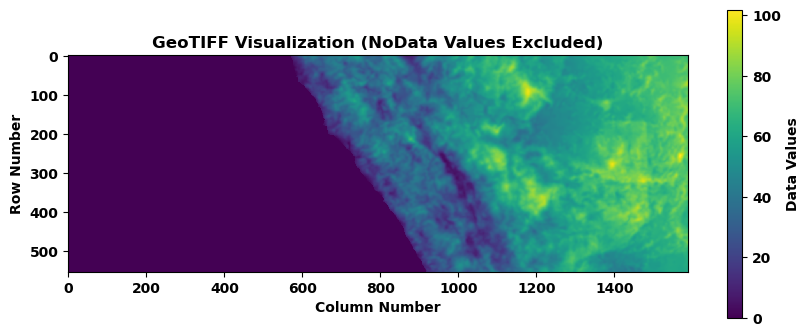

None
EPSG:28350


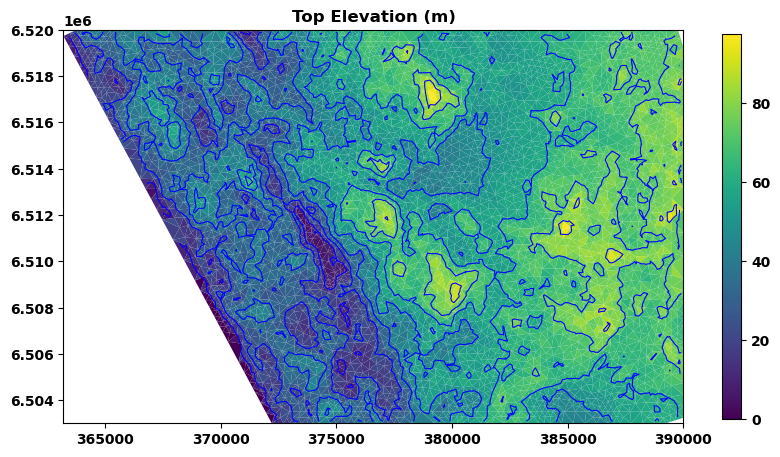

In [19]:
# Crops structuralmodel DEM to geomodel bounding box
dem = DEM(geotiff_fname = '../data/dem/cropped_raster.tif')
dem.crop_raster(bbox_path =  "../data/shp/model_boundary.shp", 
                cropped_raster_path = "../data/dem/geomodel_raster.tif")
dem.plot_geotiff()

#resample DEM to mesh
dem.resample_topo(mesh, 
                  output_fname = '../modelfiles/geomodel_topo.pkl', 
                  method="nearest", 
                  extrapolate_edges= True,) # only need to run when mesh changes. Take 1-2 minutes
dem.load_topo(fname = '../modelfiles/geomodel_topo.pkl')
dem.plot_topo(mesh, levels = np.linspace(0, 110, 10))

In [20]:
# Create geomodel surfaces
geomodel.evaluate_structuralmodel(mesh, structuralmodel, res = 5)

Creating Geomodel for  example  ...

0. Creating xyz array... 
resolution for evaluating structural model =  5
z0 z1 self.res = -1000 200 5
   Time taken Block 0 (creating xyz array) =  2.504892

1. Evaluating structural model... -----
   len(xyz) =  1573440
   Time taken Block 1 (Evaluate model) =  21.93429


In [21]:
geomodel.create_model_layers(surface = dem.topo, nls = 2) # max_thick = 50, 


2. Creating geo model layers...
   nlay =  240
   ncpl =  6556
   nlg number of geo layers =  5
   botm_geo_shape (5, 6556)
   Time taken Block 2 (Create geological model layers) 0.316579

3. Creating flow model layers...
   Time taken Block 3 create flow model layers =  0.024787

4. Calculating cellids and gradients...
   Time taken Block 4 gradients=  1.995292


365000 6512000 392000 6517000


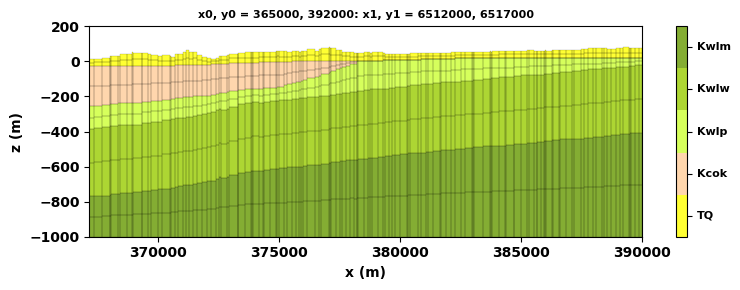

370000 6505000 392000 6510000


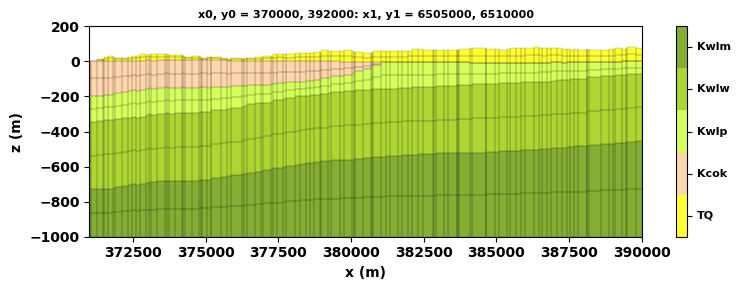

370000 6522200 378000 6501800


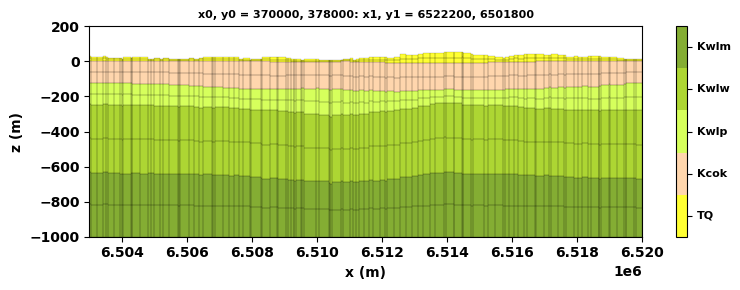

In [22]:
for i in range(len(spatial.xsections)):
    x0, y0 = spatial.xsections[i][0]
    x1, y1 = spatial.xsections[i][1]
    print(x0, y0, x1, y1)
    geomodel.geomodel_transect_lith(figsize = (8,3), plot_node = None, y0=y0, y1 = y1, x0=x0, x1=x1)

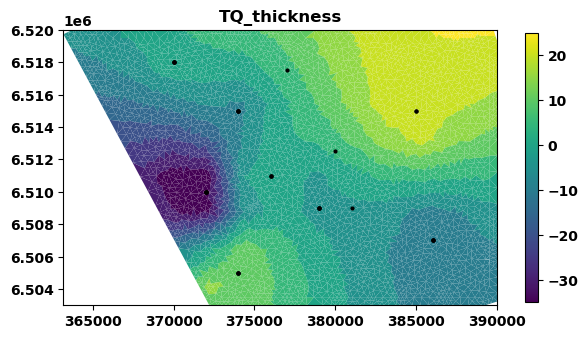

In [ ]:
array = geomodel.botm_geo[0] # Top geo layer
title = 'TQ_thickness'
xy = [structuralmodel.data.X, structuralmodel.data.Y]
mesh.plot_array(array, title = title, levels = None, xy = xy)

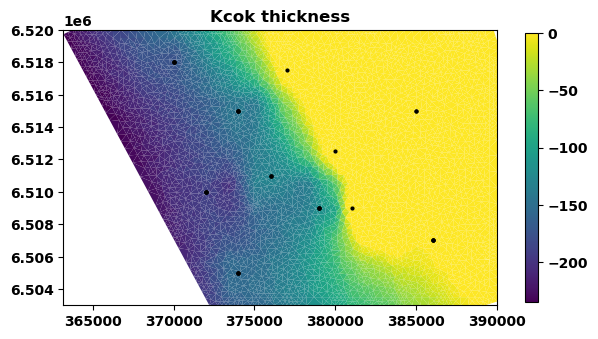

In [24]:
array = geomodel.botm_geo[1] - geomodel.botm_geo[0]# Top geo layer
title = 'Kcok thickness'
xy = [structuralmodel.data.X, structuralmodel.data.Y]
mesh.plot_array(array, title = title, levels = None, xy = xy)

### 6. Create synthetic heterogenous field

#### Method 1: Kriging between random points/values

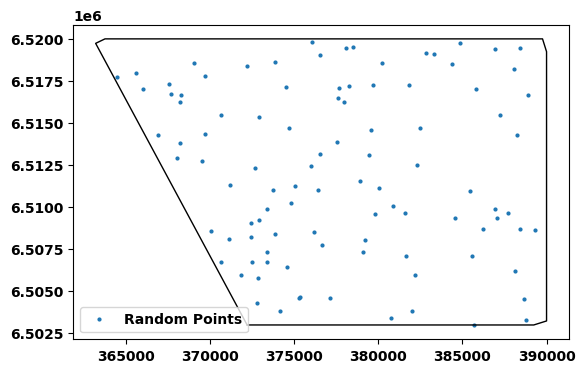

In [229]:
from preproc.truth import make_random_points, plot_random_points
make_random_points(spatial, num_points=100, fname = '../data/random_points.xlsx') # only need to do once
plot_random_points(spatial)

In [230]:
from preproc.structural import evaluate_geomodel_scalarfield
scalarfield = evaluate_geomodel_scalarfield(structuralmodel, geomodel)

k, feat =  0 TQ
TQ [5]
k, feat =  1 Kcok
Kcok [-174]
k, feat =  2 Leed
Leed [-739, -569, -184]
k, feat =  3 Leed
Leed [-739, -569, -184]
k, feat =  4 Leed
Leed [-739, -569, -184]


In [231]:
from preproc.truth import Truth1

truth1 = Truth1()
points_df = pd.read_excel('../data/random_points.xlsx')
gdf = truth1.make_randomfield_3d(geomodel, mesh, spatial, scalarfield, points_df, units = geomodel.units)
gdf

Processing unit: TQ
Processing unit: Kcok
Processing unit: Kwlp
Processing unit: Kwlw
Processing unit: Kwlm


,id,x,y,val_TQ,val_Kcok,val_Kwlp,val_Kwlw,val_Kwlm,geometry,unit,prop_mean,prop_var,icpl,cell_xy,geolay,lay,cell_disv,cell_disu,cell_z,sf_z
0,0,369700.221310,6.514343e+06,-0.526272,-0.214115,0.158704,0.143938,-0.232975,POINT (369700.221 6514343.494),TQ,0.0,1.0,3205,"(369601.1312927239, 6514370.147484248)",0,1,9761,9740,-1.165627,20.176947
1,1,372776.767107,6.504304e+06,-0.119745,-0.373936,-0.438583,-0.361528,-0.488816,POINT (372776.767 6504303.566),TQ,0.0,1.0,6520,"(372750.9177108876, 6504315.22060703)",0,1,13076,13044,18.524087,10.567769
2,2,378904.578222,6.511563e+06,-0.199990,-0.249556,-0.085916,-0.303874,-0.218133,POINT (378904.578 6511563.192),TQ,0.0,1.0,3083,"(378834.72874030995, 6511463.37113661)",0,1,9639,9619,15.037278,21.785214
3,3,387701.580779,6.509681e+06,0.279870,-0.239220,0.194629,-0.111342,-0.178251,POINT (387701.581 6509680.501),TQ,0.0,1.0,5796,"(387674.5081593789, 6509787.368965486)",0,1,12352,12320,14.234358,21.808448
4,4,372918.590293,6.515380e+06,-0.069126,0.168121,-0.060014,0.057349,-0.219899,POINT (372918.59 6515379.509),TQ,0.0,1.0,1227,"(372936.50172149384, 6515454.997482216)",0,1,7783,7764,6.411984,18.433713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,95,379224.881642,6.508035e+06,0.081384,0.297015,0.503976,-0.421340,-0.433269,POINT (379224.882 6508035.466),Kwlm,0.0,1.0,5658,"(379196.55223591253, 6507950.096318468)",4,9,64662,59120,-1000.000000,-1005.913917
455,96,382490.410040,6.514683e+06,0.161024,0.394328,-0.088874,-0.071003,-0.267946,POINT (382490.41 6514682.718),Kwlm,0.0,1.0,3299,"(382540.7692767642, 6514739.83010688)",4,9,62303,56761,-1000.000000,-1065.709328
456,97,372672.869467,6.512327e+06,-0.366954,0.471983,0.305138,0.046423,0.156706,POINT (372672.869 6512326.981),Kwlm,0.0,1.0,937,"(372640.84277804155, 6512242.417160138)",4,9,59941,54399,-1000.000000,-867.965764
457,98,368224.548768,6.513831e+06,0.010372,-0.096443,-0.185246,0.313508,0.206013,POINT (368224.549 6513830.68),Kwlm,0.0,1.0,3204,"(368379.1119473912, 6513873.398682146)",4,9,62208,56666,-1000.000000,-825.990166


In [232]:
# Makes a random stochastic field for all the units with a mean of 0 and variance of 1. Take up to 5min.
anisotropy = (1., 0.5, 0.1)
corr_length = 5000
nugget = 0.05
n_neighbors = 10
rebuild_threshold = 0.1
truth1.field = truth1.stochasticfieldgeneration(gdf, geomodel, mesh, anisotropy, corr_length, nugget, n_neighbors, rebuild_threshold, scalarfield)


######  TQ #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)

######  Kcok #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)

######  Kwlp #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)

######  Kwlw #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)

######  Kwlm #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)
len prop_layicpl_ma  10
prop_layicpl_ma  (6556,)


(array([1.000e+00, 1.000e+00, 5.000e+00, 1.000e+01, 2.610e+02, 6.233e+03,
        1.600e+01, 8.000e+00, 4.000e+00, 1.000e+00]),
 array([-0.00518846, -0.00418873, -0.00318901, -0.00218929, -0.00118957,
        -0.00018985,  0.00080987,  0.00180959,  0.00280932,  0.00380904,
         0.00480876]),
 <BarContainer object of 10 artists>)

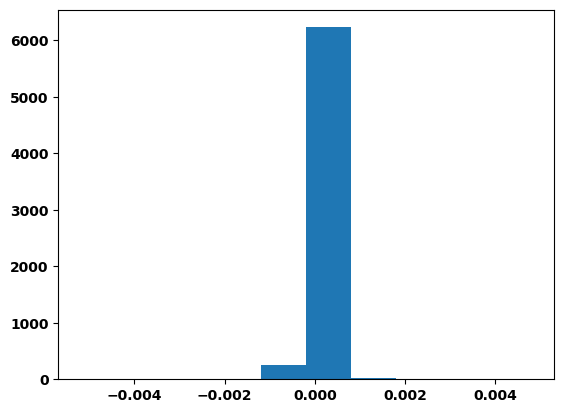

In [233]:
a = truth1.field[0] - truth1.field[1]
plt.hist(a)

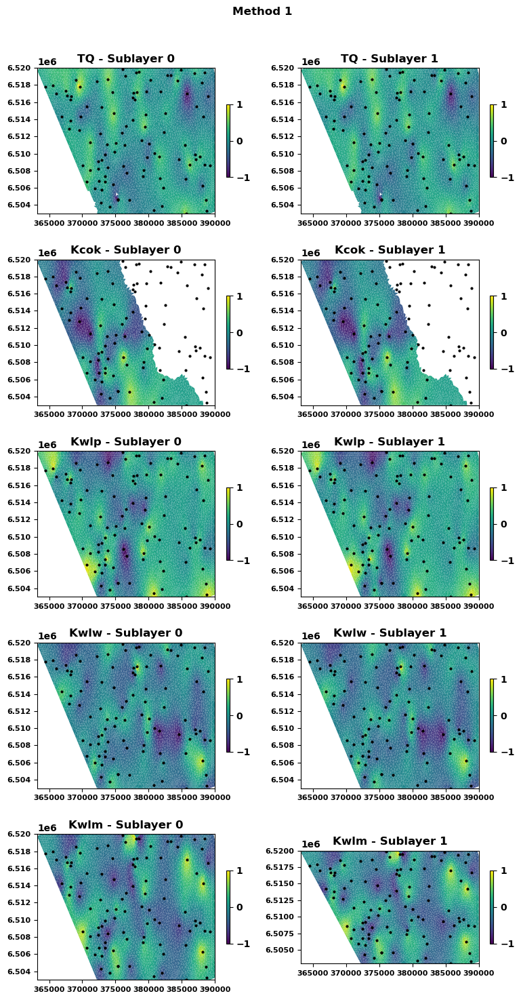

In [234]:
from preproc.truth import plot_fields

plot_fields(geomodel, mesh, field=truth1.field, title="Method 1", levels=[-1, -0.5, 0, 0.5, 1], 
            vmin = -1, vmax = 1, xy=(points_df.x.values, points_df.y.values))


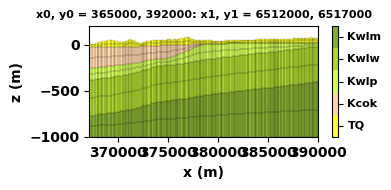

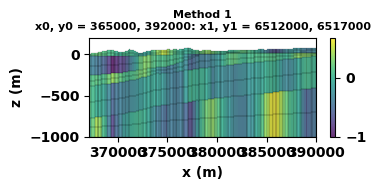

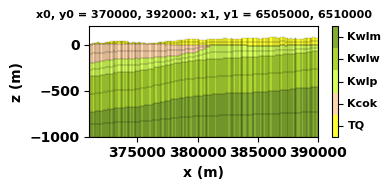

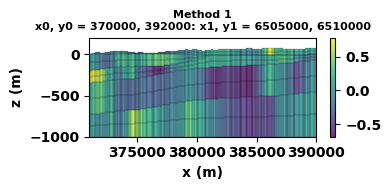

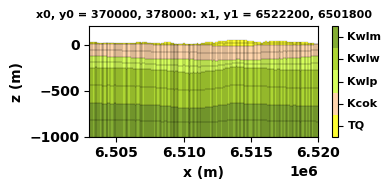

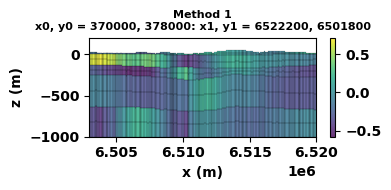

In [235]:
for i in range(len(spatial.xsections)):
    x0, y0 = spatial.xsections[i][0]
    x1, y1 = spatial.xsections[i][1]
    geomodel.geomodel_transect_lith(plot_node = None, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))
    geomodel.geomodel_transect_array(truth1.field, title = 'Method 1', grid = True, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))   

#### Method 2: Stochastic Field from random points

In [221]:
# Random field based on random points
# Makes a random stochastic field for all the units with a mean of 0 and variance of 1. Take up to 5min.
from preproc.truth import Truth2
truth2 = Truth2()

anisotropy = (1., 1., 0.1)
corr_length = 5000
nugget = 0.05
rebuild_threshold = 0.1
n_neighbours = 4
n_initial_points = 10
truth2.field = truth2.stochasticfieldgeneration(geomodel, mesh, anisotropy, corr_length, nugget, n_neighbours, n_initial_points, rebuild_threshold, scalarfield)

######  TQ #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)
######  Kcok #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)
######  Kwlp #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)
######  Kwlw #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)
######  Kwlm #########

Sublay =  0
Sublay =  1
points_values_3d.shape  (13112, 4)
prop_values  (13112,)
prop_values  (2, 6556)


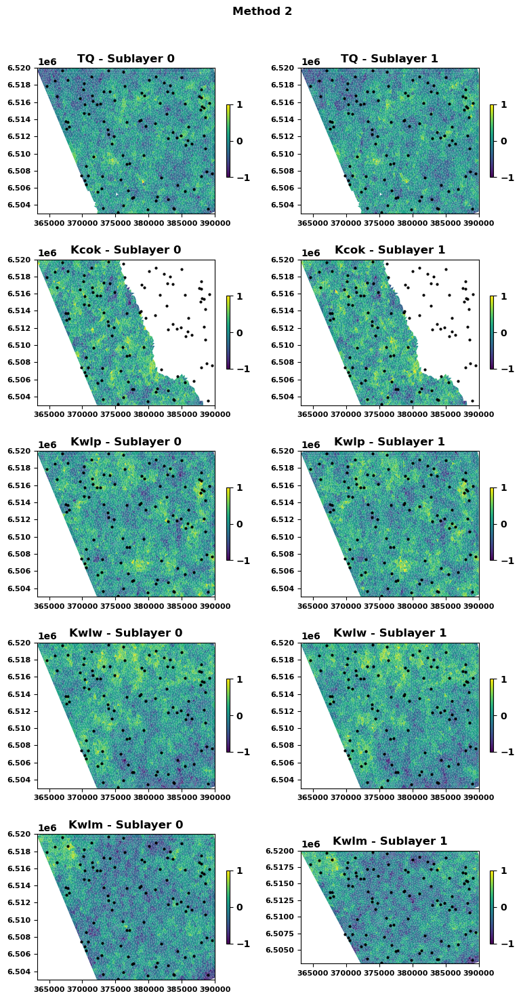

In [222]:
plot_fields(geomodel, mesh, field=truth2.field, title="Method 2", levels=[-1, -0.5, 0, 0.5, 1], 
            vmin = -1, vmax = 1, xy=(points_df.x.values, points_df.y.values))

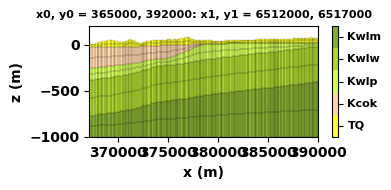

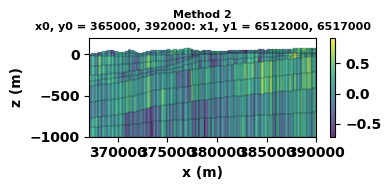

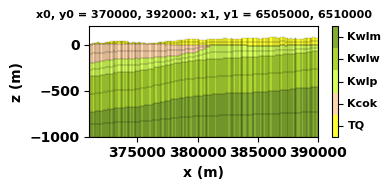

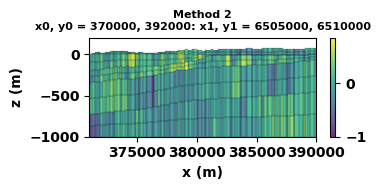

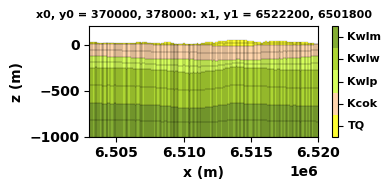

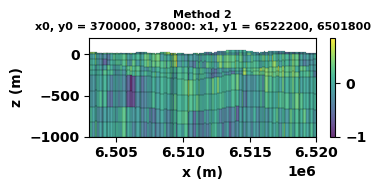

In [223]:
for i in range(len(spatial.xsections)):
    x0, y0 = spatial.xsections[i][0]
    x1, y1 = spatial.xsections[i][1]
    geomodel.geomodel_transect_lith(plot_node = None, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))
    geomodel.geomodel_transect_array(truth2.field, title = 'Method 2', grid = True, y0=y0, y1=y1, x0=x0, x1=x1, figsize = (4,2))   

In [243]:
truth1.field.shape

(10, 6556)

In [254]:
prop_df = pd.read_excel('../data/truth_properties.xlsx', sheet_name = 'truth')
prop_df


,unit,kh_mean,kv_mean,sy_mean,ss_mean,kh_logstd,kv_logstd,sy_logstd,ss_logstd
0,TQ,5.0000,0.40000,0.3,5.000000e-06,0.40,1.2,0.1,0.9
1,Kcok,0.0001,0.00001,0.2,1.000000e-04,0.06,0.2,0.1,0.4
2,Kwlp,3.0000,0.03000,0.2,1.000000e-04,0.20,0.7,0.1,0.8
3,Kwlw,15.0000,0.00200,0.2,1.000000e-06,0.50,1.5,0.1,1.1
4,Kwlm,6.6000,0.00050,0.2,9.900000e-07,0.10,0.3,0.1,0.6


In [255]:
truth1.make_prop_fields(geomodel, prop_df)

#prop_disv = prop_layicpl_ma.flatten() # includes mask
#prop_disu = prop_layicpl_ma.compressed() # doesnt include mask


######  TQ #########

Unit 0: TQ
Unit 0: TQ

######  Kcok #########

Unit 1: Kcok
Unit 1: Kcok

######  Kwlp #########

Unit 2: Kwlp
Unit 2: Kwlp

######  Kwlw #########

Unit 3: Kwlw
Unit 3: Kwlw

######  Kwlm #########

Unit 4: Kwlm
Unit 4: Kwlm


In [268]:
truth1.print_prop_stats()


### Property statistics ###

Property         Mean          Min          Max      LogMean       LogMin       LogMax
--------------------------------------------------------------------------------------
kh         6.1134e+00   8.7096e-05   4.7434e+01   1.7365e-01  -4.0600e+00   1.6761e+00
kv         1.2459e-01   6.3096e-06   6.3396e+00  -2.3994e+00  -5.2000e+00   8.0206e-01
ss         4.1360e-05   7.9433e-08   6.3096e-04  -5.1910e+00  -7.1000e+00  -3.2000e+00
sy         2.2061e-01   1.5887e-01   3.7768e-01  -6.6462e-01  -7.9897e-01  -4.2288e-01


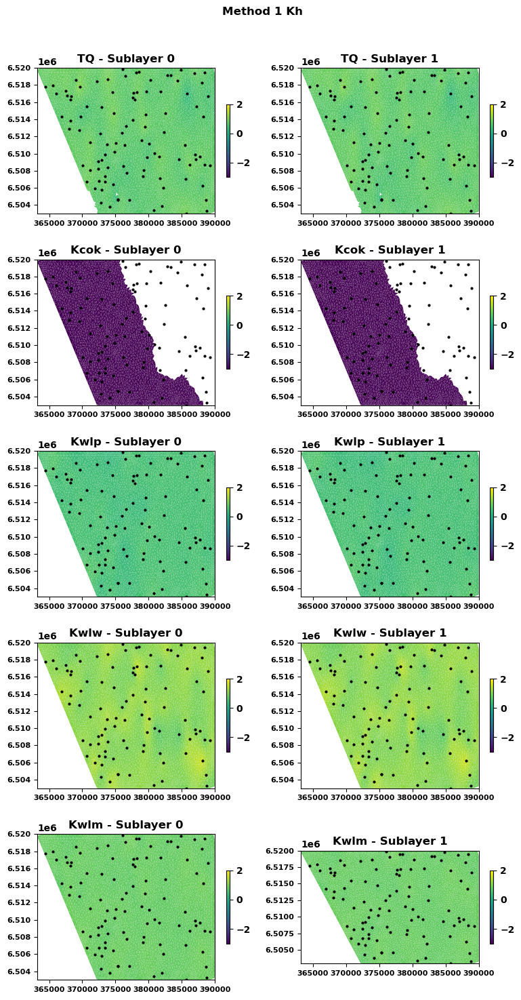

In [ ]:
plot_fields(geomodel, mesh, field=np.log10(truth1.kh), title="Method 1 Kh", 
            vmin = -3, vmax = 2, #levels=[-1, -0.5, 0, 0.5, 1],  
            xy=(points_df.x.values, points_df.y.values))

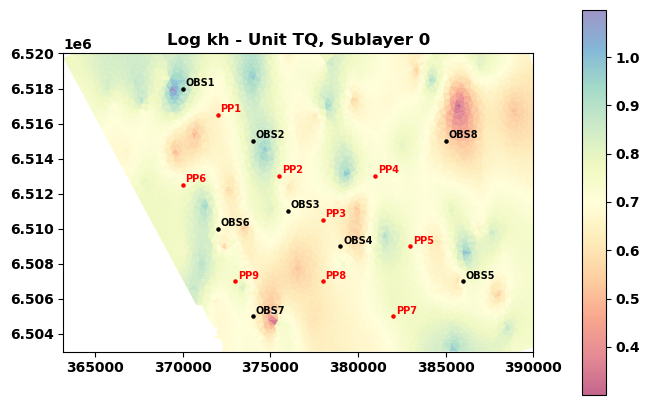

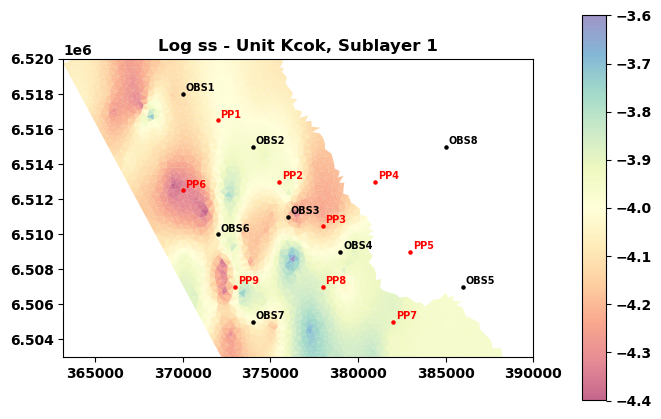

In [277]:
from preproc.truth import plot_propfield
unit, sublay, property = 'TQ', 0, 'kh'
plot_propfield(truth1, mesh, geomodel, spatial, unit, sublay, property, xlim = None, ylim = None)

unit, sublay, property = 'Kcok', 1, 'ss'
plot_propfield(truth1, mesh, geomodel, spatial, unit, sublay, property, xlim = None, ylim = None)

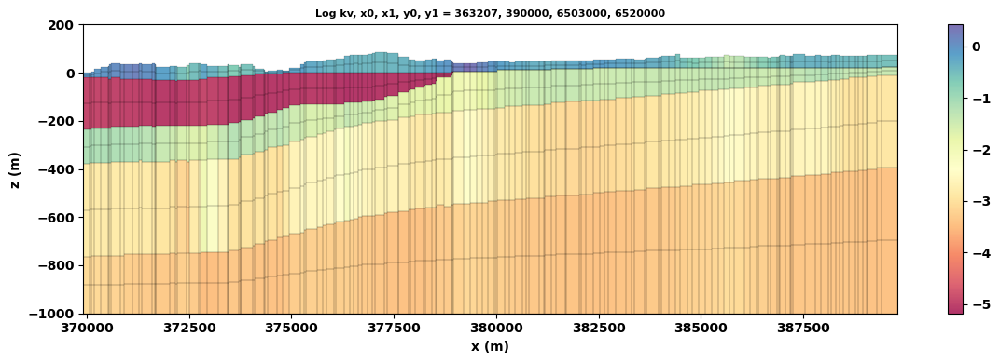

In [282]:
#spatial.xsections = [[(355000, 6530000),(400000, 6540000)], [(365000, 6510000),(400000, 6525000)]]
x0, x1, y0, y1 = spatial.xsections[0][0][0], spatial.xsections[0][1][0], spatial.xsections[0][0][1], spatial.xsections[0][1][1]
property = 'kv'
from preproc.truth import plot_propfield_usg
plot_propfield_usg(truth1,geomodel, spatial, property, x0, x1, y0, y1)

In [ ]:
props = pd.read_excel(structuralmodel.geodata_fname, sheet_name = 'properties')
geomodel.iconvert_perlay = props.iconvert.tolist()

geomodel.fill_cell_properties_heterogeneous(truth)

   6. Filling cell properties...
ang1 shape  (15, 4600)
65853
angle1 shape  (65853,)
Time taken Block 6 Fill cell properties =  0.003043


### 6. Prepare Data for Flowmodel

In [ ]:
from process_data import Data
data = Data()

data.process_ic()#geomodel)
data.process_rch(geomodel, mesh)
data.process_chd(spatial, geomodel, mesh)

wel_q = [-100000, 0]
wel_qlay= [0, 0]
data.process_wel(geomodel, mesh, spatial, wel_q, wel_qlay)

Well screens  [(np.float64(-1000.0), np.float64(-1.0)), (np.float64(-1000.0), np.float64(2.0))]


#### Process Observations

In [ ]:
df = pd.read_excel('../data/example_data.xlsx', sheet_name = 'obs_bores')
import process_observations
gdf = process_observations.make_obs_gdf(df, geomodel, mesh, spatial)

from loopflopy.observations import Observations
observations = Observations(gdf)
observations.make_recarray() # makes recarray for flowmodel

print(observations.gdf)

     id         x        y    z   kh                  geometry  cell_disv  \
0  OBS1  355120.0  6540562  -50    5    POINT (355120 6540562)      18196   
1  OBS2  364415.7  6534636 -100    1  POINT (364415.7 6534636)      22437   
2  OBS3  371000.0  6515000 -100   10    POINT (371000 6515000)      24688   
3  OBS4  385447.0  6537497 -500  100    POINT (385447 6537497)      57052   
4  OBS5  385200.0  6521000 -100    1    POINT (385200 6521000)      34486   
5  OBS6  372541.0  6525478 -100    3    POINT (372541 6525478)      25832   
6  OBS7  367502.0  6523500  -50   10    POINT (367502 6523500)      13855   

   cell_disu  (lay,icpl)  lay  icpl                               obscell_xy  \
0      17149   (3, 4396)    3  4396  (355330.98438145826, 6540327.512844525)   
1      20364   (4, 4037)    4  4037  (364261.74735699437, 6534934.394501741)   
2      21895   (5, 1688)    5  1688   (371047.0029852411, 6515430.307171156)   
3      53905  (12, 1852)   12  1852   (385496.5384433281, 65373

### 8. Create and run steady-state flow model

In [ ]:
from loopflopy.flowmodel import Flowmodel
project.mfexe_name = '../exe/mf6.exe'
scenario = 'steadymodel'

fm = Flowmodel(scenario, project, data, observations, mesh, geomodel)
# Write and run flow model files
sim = fm.write_flowmodel(chd = True, wel = True, obs = True, rch = True)
fm.run_flowmodel(sim)

   Writing simulation and gwf for  steadymodel  ...
xt3d =  True
   Time taken to write flow model =  20.016196
Running simulation for  steadymodel  ...
Model success =  True
   run_time =  11.679035
['DISU', 'NPF', 'IC', 'CHD_0', 'RCH_0', 'OBS_0', 'OC']
head results shape  (1, 65853)


In [ ]:
utils.print_object_details(fm)

Methods:
get_watertable
plot_plan
plot_transect
plot_watertable
run_flowmodel
write_flowmodel

Variables
chd
chdflow
data
geomodel
gwf
head
lith
logk11
logk33
mesh
newtonoptions
obs
obsdata
observations
project
rch
runtime
scenario
spd
staggered
wel
xt3d


In [ ]:
# IF A PROBLEM NODE FROM MFSIM, CAN LOT LOCATION HERE!
#utils.plot_node(1508-1, geomodel, structuralmodel, spatial, sim, scenario, z1 = 500, features = ['fault'])

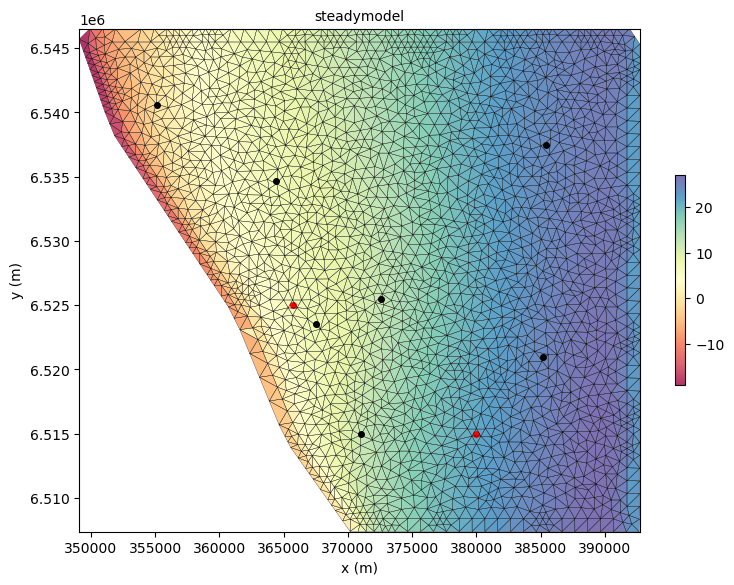

In [ ]:
watertable = fm.get_watertable(geomodel, fm.head)
fm.plot_watertable(spatial, mesh, geomodel, fm, watertable,)#, extent, vmin, vmax

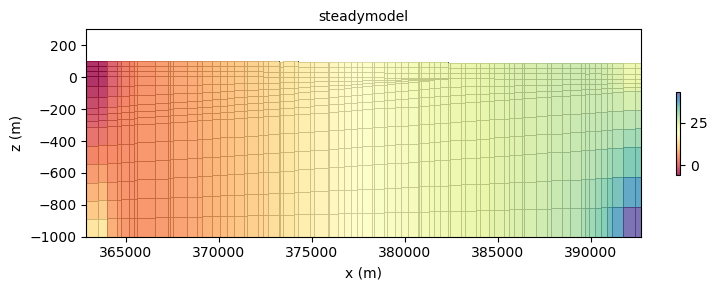

In [ ]:
fm.plot_transect(spatial, structuralmodel, 'head',  y0 = 6520000, y1 = 6520000, z1 = 300)#, X0, X1, Y0, Y1)

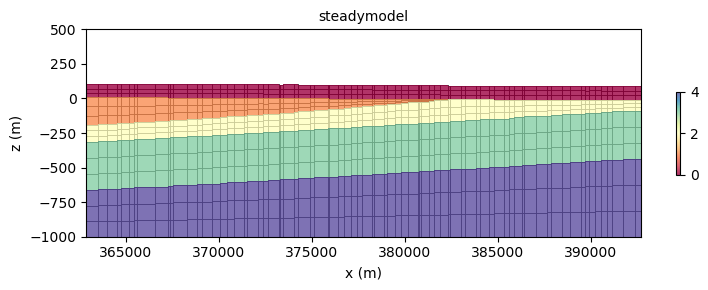

In [ ]:
fm.plot_transect(spatial, structuralmodel, 'lith', y0 = 6520000, y1 = 6520000)

In [ ]:
obj = fm
methods = [func for func in dir(obj) if callable(getattr(obj, func)) and not func.startswith("__")]
print("Methods in the class:  ",methods)
attributes = [attr for attr in dir(obj) if not callable(getattr(obj, attr)) and not attr.startswith("__")]
print("\nAttributes in the class:  ", attributes)

#for attribute, value in flowmodel.data.__dict__.items(): print(attribute)

Methods in the class:   ['get_watertable', 'plot_plan', 'plot_transect', 'plot_watertable', 'run_flowmodel', 'write_flowmodel']

Attributes in the class:   ['chd', 'chdflow', 'data', 'geomodel', 'gwf', 'head', 'lith', 'logk11', 'logk33', 'mesh', 'newtonoptions', 'obs', 'obsdata', 'observations', 'project', 'rch', 'runtime', 'scenario', 'spd', 'staggered', 'wel', 'xt3d']


### Create a steady state "truth"

In [ ]:
# Get convert obs package to arrays of oberservation heads
heads_truth = fm.head

# Get times
csv_file = os.path.join('../results/ref_past.csv')
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_past = df.iloc[:,0]/365
csv_file = os.path.join(project.workspace, R.modelname + "_future.csv")
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_future = df.iloc[:,0]/365+2
times = list(times_past) + list(times_future)

# Pickle reference results
fname = P.results + 'times.pkl'
pickle.dump(times, open(os.path.join(fname),'wb'))
fname = '../results/ref_ss.pkl'
pickle.dump(R.ref_steady, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_past.pkl'
pickle.dump(R.ref_past, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_future.pkl'
pickle.dump(R.ref_future, open(os.path.join(fname),'wb'))


### 9. Create and run transient flow model

In [ ]:
scenario = 'transientmodel'
well_q = [-2000, -2000]
data.process_wel(geomodel, mesh, spatial, well_q, wel_qlay)
data.strt = fm.head
fm2 = Flowmodel(scenario, project, data, observations, mesh, geomodel)

perlen = 2 * 365 # length of period (days)
nts = 12         # number of time steps for this period
fm2.perioddata = [(perlen, nts, 1.1)] # perlen, nts, tsmult

Well screens  [(np.float64(-1000.0), np.float64(32.0)), (np.float64(-1000.0), np.float64(6.0))]


In [ ]:
sim = fm2.write_flowmodel(transient = True, chd = True, wel = True, obs = True, rch = True)

   Writing simulation and gwf for  transientmodel  ...
   Time taken to write flow model =  5.524102


In [ ]:
fm2.run_flowmodel(sim, transient = True)

Running simulation for  transientmodel  ...
Model success =  True
   run_time =  10.117995
['DISU', 'NPF', 'IC', 'STO', 'WEL_0', 'CHD_0', 'RCH_0', 'OBS_0', 'OC']
head results shape  (1, 13358)


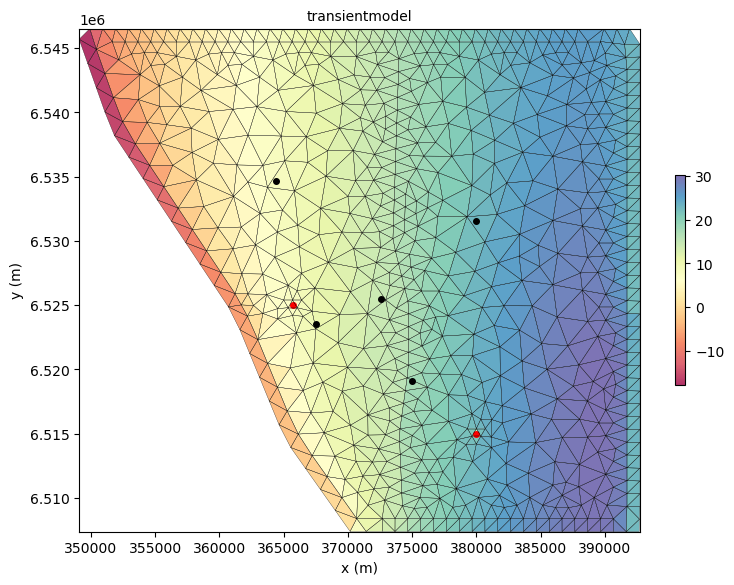

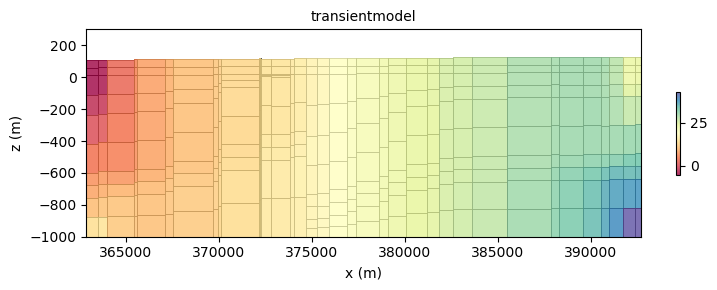

In [ ]:
watertable = fm2.get_watertable(geomodel, fm2.head)
fm2.plot_watertable(spatial, mesh, geomodel, fm2, watertable,)#, extent, vmin, vmax
fm2.plot_transect(spatial, structuralmodel, 'head',  y0 = 6520000, y1 = 6520000, z1 = 300)#, X0, X1, Y0, Y1)

#### Create "truth" observations and plot

In [ ]:
# Get convert obs package to arrays of oberservation heads
R.ref_steady  = functions.process_obs_steady(P, R)
R.ref_past    = functions.process_obs_past(P, R)
R.ref_future  = functions.process_obs_future(P, R)

# Get times
csv_file = os.path.join(P.workspace, R.modelname + "_past.csv")
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_past = df.iloc[:,0]/365
csv_file = os.path.join(P.workspace, R.modelname + "_future.csv")
data_set = pd.read_csv(csv_file, header=0)
df = pd.DataFrame(data_set)
times_future = df.iloc[:,0]/365+2
times = list(times_past) + list(times_future)

# Pickle reference results
fname = P.results + 'ref_ss.pkl'
pickle.dump(R.ref_steady, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_past.pkl'
pickle.dump(R.ref_past, open(os.path.join(fname),'wb'))
fname = P.results + 'ref_future.pkl'
pickle.dump(R.ref_future, open(os.path.join(fname),'wb'))
fname = P.results + 'times.pkl'
pickle.dump(times, open(os.path.join(fname),'wb'))

In [ ]:
# PLOT REFERENCE OBSERVATIONS
import matplotlib.pyplot as plt
colors = ['red','green','blue']
R.ref_future.shape
for j in range(P.nobs):
    for i in range(P.nzobs):
        plt.plot(times_past, R.ref_past[j][i],'o', ms = 2, color = colors[i])
        plt.plot(times_future, R.ref_future[j][i],'o', ms = 2, color = colors[i])
plt.xlabel('Time (years)')
plt.ylabel('Head (m)')

In [ ]:
# CREATE SYNTHETIC OBSERVATIONS BY PERTURBING ACTUAL HEADS
err = 0.05
hobs_ref = np.copy(R.ref_past)    
for i in range(P.nobs):
    for j in range(P.nzobs):
        for k in range(hobs_ref.shape[2]):
            hobs_ref[i][j][k] += np.random.normal(0.,err) # Perturb samples either side of measurement
plt.plot(R.ref_past.flatten(), 'o', ms = 1, label = 'actual heads')
plt.plot(hobs_ref.flatten(),'o', ms = 1, label = 'perturbed heads')
plt.xlabel('Observation index')
plt.ylabel('Head (m)')
plt.legend()

In [ ]:
%run ./figures.ipynb   
figure8(P, R)

#### Prepare PEST input arrays

In [ ]:
# PRINTING TRUTH HEADS FOR HISTORY MATCHING (PEST - HEADS.INS)
hobs_ref.shape #(5, 3, 12)
for i in range(P.nobs):
    for j in range(P.nzobs):
        for k in range(hobs_ref.shape[2]):
            print('l1 [OBS%i_%i.%i]1:20' %(i, j, k))

In [ ]:
# PRINTING TRUTH HEADS FOR HISTORY MATCHING (PEST - CONTROL.PST)
for i in range(P.nobs):
    for j in range(P.nzobs):
        for k in range(hobs_ref.shape[2]):
            print('OBS%i_%i.%i  %f  10.0  head' %(i, j, k, hobs_ref[i, j, k]))

#### Prepare parameter bounds

In [ ]:
# LOG
k_min = [0, -2, 0, -2, -1, -2.5, -0.5, -2.5, -5, -5, -5]
k_max = [1, -1, 1, -1, 0, -1.5, 0.5, -1.5, -4, -4, -4]
k_mean = [(k_max[i] - k_min[i])/2 + k_min[i] for i in range(len(k_min))]

print(k_min)
print(k_max)
print(k_mean)

In [ ]:
pickleoff = open('../results/reference.pkl','rb')
reference = pickle.load(pickleoff)
pickleoff.close()

# BLUE - MAX/MIN
# ORANGE - MEAN
# RED - ACTUAL
fig = plt.figure(figsize = (12,5))
plt.plot(np.linspace(0,10,11), k_min, 'o', color = 'blue')
plt.plot(np.linspace(0,10,11), k_max, 'o', color = 'blue')
plt.plot(np.linspace(0,10,11), k_mean, 'o', color = 'orange')
plt.plot(np.linspace(0,10,11), logfunc(reference[0] + reference[1] + reference[2][1:]), 'o', color = 'red')
plt.ylabel('Log')
plt.xticks(np.linspace(0,10,11), ['loghk0', 'loghk1', 'loghk2', 'loghk3', 
                                'logvk0', 'logvk1', 'logvk2', 'logvk3',
                                'logss1', 'logss2', 'logss2'])#, logss1, logss2, logss3, sy0, cp])
plt.show()

#### Pilot Point Setup

In [ ]:
properties = Properties() # set up a new properties object
df = pd.read_excel('../data/example_data.xlsx', sheet_name = 'pilot_points')
properties.make_gdf(geomodel, mesh, spatial, df)
#print(properties.gdf)

anisotropy = (1., 1., 0.0001)
CL = 5000.
nugget = 0.05
rebuild_threshold = 0.1

properties.kriging(geomodel, mesh, anisotropy, CL, nugget, rebuild_threshold)

#spatial.xsections = [[(355000, 6530000),(400000, 6540000)], [(365000, 6510000),(400000, 6525000)]]
x0, x1, y0, y1 = spatial.xsections[0][0][0], spatial.xsections[0][1][0], spatial.xsections[0][0][1], spatial.xsections[0][1][1]
properties.plot_propfield_usg(geomodel, spatial, x0, x1, y0, y1, property = 'kh')

'''# LOG
k_min = [0, -2, 0, -2]
k_max = [1, -1, 1, -1]
k_mean = [(k_max[i] - k_min[i])/2 + k_min[i] for i in range(len(k_min))]

print(k_min)
print(k_max)
print(k_mean)

Min.append(k_min[i+8]) 
Max.append(k_max[i+8])

# LAYER K
nr_param = 200 # Create lots of parameter sets
nr = 100 # How many successful flow models we want
import random 
logfunc = lambda e: np.log10(e)

def normal_sampling(mu, sigma, nr_param):
    nums = [] 
    count = 0
    while count < nr_param:
        temp = random.gauss(mu,sigma) 
        if temp >= mu - 3 * sigma and temp <= mu + 3*sigma:
            nums.append(temp)
            count += 1
    return(nums)

hk_mu = np.copy(hk) # from variables.ipynb
hk_mu_log = logfunc(hk_mu)
hk_sigma_log = [0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66]

vk_mu = np.copy(vk) # from variables.ipynb
vk_mu_log = logfunc(vk_mu)
vk_sigma_log = [0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66, 0.66]

hk_parameters = []
vk_parameters = []

for n in range(8): # for each layer
    hk_parameters.append(normal_sampling(hk_mu_log[n], hk_sigma_log[n], nr_param))'''

#### History Matching

In [ ]:
def plot_scalarfield(self, transect_y, nx, nz, **kwargs):

        self.sequence_names = []
        for item in self.strat['sequence'].tolist():
            if item not in self.sequence_names:
                self.sequence_names.append(item)

        x0 = kwargs.get('x0', self.x0)
        z0 = kwargs.get('z0', self.z0)
        x1 = kwargs.get('x1', self.x1)
        z1 = kwargs.get('z1', self.z1)
        
        z = np.linspace(z0, z1, nz)
        x = np.linspace(x0, x1, nx)
        X,Z = np.meshgrid(x,z)

        labels = self.strat_names[1:]
        ticks = [i for i in np.arange(0,len(labels))]
        boundaries = np.arange(-1,len(labels),1)+0.5
        Y = np.zeros_like(X)
        Y[:,:] = transect_y[0]
        V = self.model.evaluate_model(np.array([X.flatten(),Y.flatten(),Z.flatten()]).T).reshape(np.shape(Y))
        
        for i, n in enumerate(transect_y):
            fig = plt.figure(figsize=(12, 3))
            ax = plt.subplot(len(transect_y), 1, i+1)
            

            val_above = 0
            # Evaluate scalar fields for each feature to plot contours
            for feat in self.sequence_names:
                print(feat)
                A = self.model.evaluate_feature_value(feat, np.array([X.flatten(),Y.flatten(),Z.flatten()]).T).reshape(np.shape(Y))
                print(A.shape)
                ax.imshow(np.ma.masked_where(V<0,A), origin = "lower", extent = [x0,x1,z0,z1])

            # Evaluate faults to plot
            #for fault in self.faults:
            #    F = self.model.evaluate_feature_value(fault, np.array([X.flatten(),Y.flatten(),Z.flatten()]).T).reshape(np.shape(Y))
            #    ax.contour(X, Z, F, levels = [0], colors = 'Black', linewidths=2., linestyles = 'dashed') 
            if i < (len(transect_y)-1):
                ax.set_xticks(ticks = [], labels = [])
            else:
                ax.set_xlabel('Northing (m)')

            #cbar.ax.set_yticks(ticks = ticks, labels = labels, size = 8, verticalalignment = 'center')    
            ax.set_title("y = " + str(transect_y[i]), size = 8)
            ax.set_ylabel('Elev. (mAHD)')
            ax.set_aspect('10') #0.5, 'equal'
            #plt.axis('equal')
            plt.savefig('../figures/structural_ytransects.png')
            plt.show()

plot_scalarfield(structuralmodel, transect_y, nx = 60, nz = 60, z0 = -200, )#z1 = 000) #x0 = 370000, x1 = 374000, 